In [1]:
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as sts
from config import *
import road_systems_ising
from road_systems_ising import *
from collections import defaultdict
import importlib

In [2]:
with open("nodes", "rb") as fp:  #Unpickling
    nodes = pickle.load(fp)
with open("edges", "rb") as fp:  #Unpickling
    edges = pickle.load(fp)
with open("traffic_network", "rb") as fp:  #Unpickling
    G = pickle.load(fp)
with open("relative_arrival_rates", "rb") as fp: #Unpcikling
    relative_arrival_rates = pickle.load(fp)
with open("optimal_network_flow", "rb") as fp:   #Unpickling
    netflow_values,results, conf_int, simulated_density,simualted_density_conf_int,road_wise_data = pickle.load(fp)

In [3]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import matplotlib.animation as anim
import numpy as np
from IPython.display import HTML
from tqdm import tqdm
def make_animation(sim, total_frames, steps_per_frame=1, interval=100, title = ''):
    def update(frame_number):
        for _ in range(steps_per_frame):
            sim.update()
        progress_bar.update(1)
        return [sim.draw(title)]

    progress_bar = tqdm(total=total_frames)
    animation = FuncAnimation(
        sim.figure, update, init_func=lambda: [], frames=total_frames, interval=interval)
    output = HTML(animation.to_html5_video())
    sim.figure.clf()
    return output


In [156]:
import road_systems_ising
importlib.reload(road_systems_ising)
from road_systems_ising import *


100%|██████████████████████████████████████| 1500/1500 [00:04<00:00, 337.07it/s]


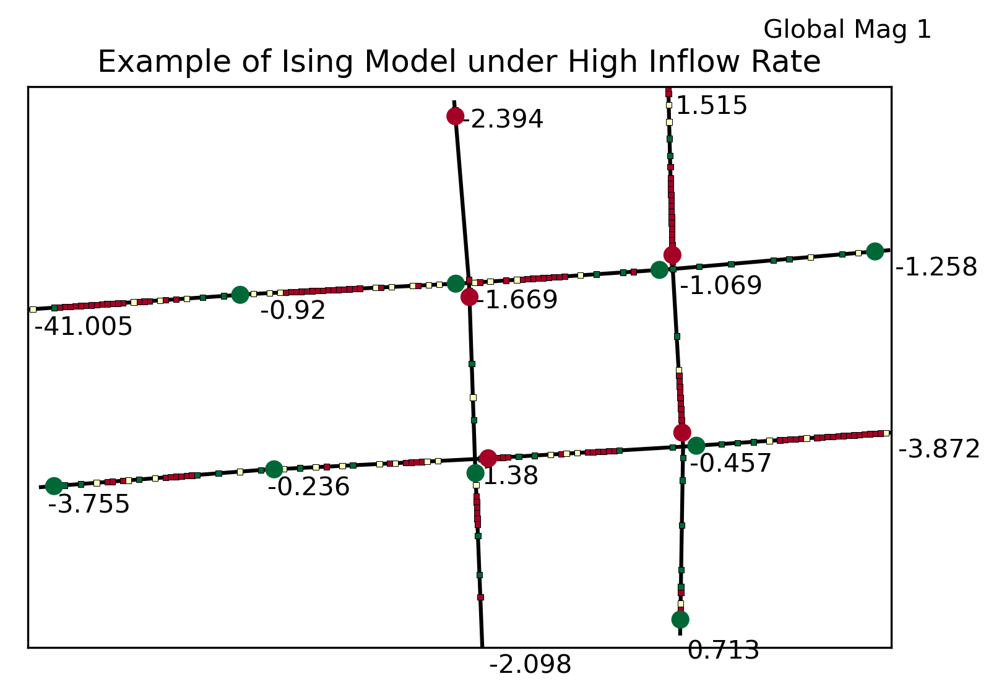

In [160]:
sim = TrafficSystemIsing()
out = sim.build_network(edges, nodes, relative_arrival_rates, netflow_rate = 1.2, traffic_cycle = [36,54],
                        ising_params = [1,1,0.2,5])
for __ in tqdm(range(1500)):
    sim.update()
    
sim.draw("Example of Ising Model under High Inflow Rate")


In [63]:
def real_flow_rate(sim, cut_off_time):
    """
    Returns the real inflow and outflow rate through the system
    
    return:
        inflow_rate : float
        outflow_rate: float
    """
    cars_out = 0
    for node in sim.outflows:
        cars_out += (len([x for x in node.pool if x.entranceTime > cut_off_time]))
    outflow_rate = cars_out / (sim.time - cut_off_time)
    #Cars out + cars in system = how many cars went into the system
    #Assume sim.time >> cut_off_time so no vehicles from before cutoff is in the system
    inflow_rate = (cars_out + sim.cars_in_system) / (sim.time - cut_off_time)
    return(inflow_rate,outflow_rate)



In [12]:
sim_lengths = []
for i in G.edges(data = True):
    sim_lengths.append([i[2]["Edge_ID"],i[2]["sim_distance"]])
sim_dists = pd.DataFrame(sim_lengths, columns = ["Road_ID", "simDist"])
def compute_weighted_hmean(dataCollection):
    weighted_harmonicAverages = []
    for frame in dataCollection:
        df = frame.merge(sim_dists,left_on = "Road_ID", right_on = "Road_ID" )
        weighted_harmonicAverages.append(sts.hmean(df["harmonicAverageSpeed"], weights = df["simDist"]))
    avgHmean = np.mean(weighted_harmonicAverages)
    errHmean = sts.sem(weighted_harmonicAverages)
    return(avgHmean,errHmean)

In [13]:
with open("optimal_network_flow", "rb") as fp:   #Unpickling
    netflow_values,results, conf_int, simulated_density,simualted_density_conf_int,road_wise_data = pickle.load(fp)

avgHmeans = []
errHmeans = []
for dfCollection in road_wise_data:
    avgHmean,errHmean = compute_weighted_hmean(dfCollection)
    avgHmeans.append(avgHmean)
    errHmeans.append(errHmean)
results_opt_orig = [netflow_values,avgHmeans,errHmeans,simulated_density,simualted_density_conf_int]



In [14]:
def flow_rate_obj(x):
    
    obj_value = 0
    begin_collection = 600
    run_until = 4500
    flow_rate_indexes = [4,7,10,15,22,30,38]
    for flow_rate_idx in flow_rate_indexes:
        flow_rate = netflow_values[flow_rate_idx]
        for trial in range(1):
            sim = TrafficSystemIsing()
            out = sim.build_network(edges, nodes, relative_arrival_rates, netflow_rate = flow_rate, traffic_cycle = [36,54],
                                ising_params = x)
            for __ in range(run_until):
                sim.update()
            plt.close()
    
            inflow, outflow = real_flow_rate(sim, begin_collection)
            #We want to minimize the deviation from setting params
            deviation_from_real_inflow = (1- inflow/flow_rate)**2
            dev_from_net_outflow_rate = (1- outflow/flow_rate)**2
            
            
            #Compute the Harmonic Average
            cars = []
            for outflow in sim.outflows:
                for car in outflow.pool:
                    if car.exitTime > begin_collection:
                        cars.append(car)
            avg_speeds = [((car.distanceTravelled *cell_size )/ (car.exitTime - car.entranceTime)) /
                          kmh_to_ms_conversion 
                          for car in cars]
            
            car_harmonic_avg_speed = statistics.harmonic_mean(avg_speeds)
            #The first index is the harmonic average of the original data 
            baseline_data_harmonic_avg = results_opt_orig[1][flow_rate_idx]
            #Limit value, since baseline harmonic avg is near 0 at high density.
            proportion_improvement = min(2*(np.log(car_harmonic_avg_speed / baseline_data_harmonic_avg))**2,1)
            
            #Every 90 seconds, we flip twice. We want to reward good flipping and not overflipping
            global_cycles = (run_until // np.sum(sim.traffic_manager.master_cycle))*2
            
            #Either too much or too little flips from the global clock will be penalized
            
            percentage_flip_diff = (
                                    1- (sim.traffic_manager.signs_flipped /
                                    (global_cycles*len(sim.traffic_manager.nodes))
                                       )
                                   )**2
            #Minimize deviations from input params, maximize harmonic average speed
            #Penalize too much or too little flips
            #Reward Improvement in Harmonic Average Proportionally to the baseline model
            obj_value += (10*deviation_from_real_inflow + 4*dev_from_net_outflow_rate +
                          7*percentage_flip_diff - 4*proportion_improvement )
            del sim
            
    return obj_value
            
            
            

In [15]:
from skopt import gp_minimize


# !!!Warning!!!
Costly cell to run below. 

In [16]:
from skopt.space import Real
res = gp_minimize(flow_rate_obj,dimensions= [Real(1e-10,10),Real(0.9,1.1),Real(-2,2),Real(0,10)],
                  n_calls = 200, 
                  n_jobs = -1,
                  verbose = True)



Iteration No: 1 started. Evaluating function at random point.
Iteration No: 1 ended. Evaluation done at random point.
Time taken: 96.7759
Function value obtained: 54.2595
Current minimum: 54.2595
Iteration No: 2 started. Evaluating function at random point.
Iteration No: 2 ended. Evaluation done at random point.
Time taken: 90.4776
Function value obtained: 46.3770
Current minimum: 46.3770
Iteration No: 3 started. Evaluating function at random point.
Iteration No: 3 ended. Evaluation done at random point.
Time taken: 89.8521
Function value obtained: 8.1399
Current minimum: 8.1399
Iteration No: 4 started. Evaluating function at random point.
Iteration No: 4 ended. Evaluation done at random point.
Time taken: 154.1886
Function value obtained: 33.4081
Current minimum: 8.1399
Iteration No: 5 started. Evaluating function at random point.
Iteration No: 5 ended. Evaluation done at random point.
Time taken: 116.7672
Function value obtained: 25.7902
Current minimum: 8.1399
Iteration No: 6 starte

/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 20 ended. Search finished for the next optimal point.
Time taken: 100.4071
Function value obtained: -0.0685
Current minimum: -1.3751
Iteration No: 21 started. Searching for the next optimal point.
Iteration No: 21 ended. Search finished for the next optimal point.
Time taken: 127.5686
Function value obtained: 6.9747
Current minimum: -1.3751
Iteration No: 22 started. Searching for the next optimal point.
Iteration No: 22 ended. Search finished for the next optimal point.
Time taken: 100.6959
Function value obtained: 1.2118
Current minimum: -1.3751
Iteration No: 23 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 23 ended. Search finished for the next optimal point.
Time taken: 132.8003
Function value obtained: 0.2600
Current minimum: -1.3751
Iteration No: 24 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 24 ended. Search finished for the next optimal point.
Time taken: 109.3113
Function value obtained: 0.0237
Current minimum: -1.3751
Iteration No: 25 started. Searching for the next optimal point.
Iteration No: 25 ended. Search finished for the next optimal point.
Time taken: 110.6533
Function value obtained: 47.3150
Current minimum: -1.3751
Iteration No: 26 started. Searching for the next optimal point.
Iteration No: 26 ended. Search finished for the next optimal point.
Time taken: 113.2751
Function value obtained: 1.4237
Current minimum: -1.3751
Iteration No: 27 started. Searching for the next optimal point.
Iteration No: 27 ended. Search finished for the next optimal point.
Time taken: 111.3822
Function value obtained: 7.0982
Current minimum: -1.3751
Iteration No: 28 started. Searching for the next optimal point.
Iteration No: 28 ended. Search finished for the next optimal point.
Time taken: 118.2423
Function value obtained: 3.9869
Current minimum: -1.3751
Iteration No:

Iteration No: 63 ended. Search finished for the next optimal point.
Time taken: 79.8525
Function value obtained: -0.9825
Current minimum: -1.9151
Iteration No: 64 started. Searching for the next optimal point.
Iteration No: 64 ended. Search finished for the next optimal point.
Time taken: 78.8774
Function value obtained: -1.3081
Current minimum: -1.9151
Iteration No: 65 started. Searching for the next optimal point.
Iteration No: 65 ended. Search finished for the next optimal point.
Time taken: 80.0589
Function value obtained: -1.0160
Current minimum: -1.9151
Iteration No: 66 started. Searching for the next optimal point.
Iteration No: 66 ended. Search finished for the next optimal point.
Time taken: 79.8437
Function value obtained: -0.8936
Current minimum: -1.9151
Iteration No: 67 started. Searching for the next optimal point.
Iteration No: 67 ended. Search finished for the next optimal point.
Time taken: 80.1106
Function value obtained: -0.5046
Current minimum: -1.9151
Iteration No: 

Iteration No: 102 ended. Search finished for the next optimal point.
Time taken: 77.4593
Function value obtained: -1.4294
Current minimum: -2.0299
Iteration No: 103 started. Searching for the next optimal point.
Iteration No: 103 ended. Search finished for the next optimal point.
Time taken: 77.1239
Function value obtained: -1.5348
Current minimum: -2.0299
Iteration No: 104 started. Searching for the next optimal point.
Iteration No: 104 ended. Search finished for the next optimal point.
Time taken: 77.4529
Function value obtained: -2.4390
Current minimum: -2.4390
Iteration No: 105 started. Searching for the next optimal point.
Iteration No: 105 ended. Search finished for the next optimal point.
Time taken: 77.4343
Function value obtained: -1.2044
Current minimum: -2.4390
Iteration No: 106 started. Searching for the next optimal point.
Iteration No: 106 ended. Search finished for the next optimal point.
Time taken: 77.7075
Function value obtained: -1.3145
Current minimum: -2.4390
Itera

Iteration No: 141 ended. Search finished for the next optimal point.
Time taken: 77.3544
Function value obtained: -2.0636
Current minimum: -2.9900
Iteration No: 142 started. Searching for the next optimal point.
Iteration No: 142 ended. Search finished for the next optimal point.
Time taken: 77.7920
Function value obtained: -1.8312
Current minimum: -2.9900
Iteration No: 143 started. Searching for the next optimal point.
Iteration No: 143 ended. Search finished for the next optimal point.
Time taken: 78.3660
Function value obtained: -1.5479
Current minimum: -2.9900
Iteration No: 144 started. Searching for the next optimal point.
Iteration No: 144 ended. Search finished for the next optimal point.
Time taken: 76.8491
Function value obtained: -2.0491
Current minimum: -2.9900
Iteration No: 145 started. Searching for the next optimal point.
Iteration No: 145 ended. Search finished for the next optimal point.
Time taken: 78.8572
Function value obtained: -1.5758
Current minimum: -2.9900
Itera

Iteration No: 180 ended. Search finished for the next optimal point.
Time taken: 78.6890
Function value obtained: -1.3853
Current minimum: -2.9900
Iteration No: 181 started. Searching for the next optimal point.
Iteration No: 181 ended. Search finished for the next optimal point.
Time taken: 79.5241
Function value obtained: -1.2485
Current minimum: -2.9900
Iteration No: 182 started. Searching for the next optimal point.
Iteration No: 182 ended. Search finished for the next optimal point.
Time taken: 77.7267
Function value obtained: -2.0567
Current minimum: -2.9900
Iteration No: 183 started. Searching for the next optimal point.
Iteration No: 183 ended. Search finished for the next optimal point.
Time taken: 79.0084
Function value obtained: -1.9196
Current minimum: -2.9900
Iteration No: 184 started. Searching for the next optimal point.
Iteration No: 184 ended. Search finished for the next optimal point.
Time taken: 78.4005
Function value obtained: -1.0078
Current minimum: -2.9900
Itera

In [32]:
res.x

[1e-10, 1.1, 0.12830209030188655, 6.385096122268158]

In [165]:
sim = TrafficSystemIsing()
out = sim.build_network(edges, nodes, relative_arrival_rates, netflow_rate = 1.2, traffic_cycle = [36,54],
                                ising_params = res.x)

make_animation(sim, total_frames=500, steps_per_frame=1, title = "Ising Sim with General-Fitted Optimized Parameters")



100%|█████████████████████████████████████████| 500/500 [00:46<00:00, 10.78it/s]


<Figure size 1800x1200 with 0 Axes>

<AxesSubplot:title={'center':'Convergence plot'}, xlabel='Number of calls $n$', ylabel='$\\min f(x)$ after $n$ calls'>

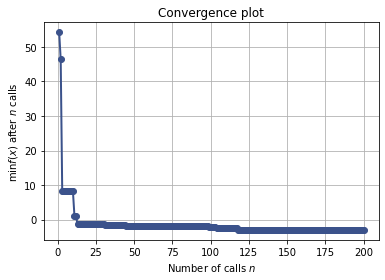

In [19]:
from skopt.plots import plot_convergence
plot_convergence(res)

In [20]:
#Runs the second test with only one point to fit the model to
def flow_rate_obj_optimal_point(x):
    
    obj_value = 0
    begin_collection = 600
    run_until = 4500
    flow_rate_indexes = [10]
    for flow_rate_idx in flow_rate_indexes:
        flow_rate = netflow_values[flow_rate_idx]
        for trial in range(3):
            sim = TrafficSystemIsing()
            out = sim.build_network(edges, nodes, relative_arrival_rates, netflow_rate = flow_rate, traffic_cycle = [36,54],
                                ising_params = x)
            for __ in range(run_until):
                sim.update()
            plt.close()
    
            inflow, outflow = real_flow_rate(sim, begin_collection)
            #We want to minimize the deviation from setting params
            deviation_from_real_inflow = (1- inflow/flow_rate)**2
            dev_from_net_outflow_rate = (1- outflow/flow_rate)**2
            
            
            #Compute the Harmonic Average
            cars = []
            for outflow in sim.outflows:
                for car in outflow.pool:
                    if car.exitTime > begin_collection:
                        cars.append(car)
            avg_speeds = [((car.distanceTravelled *cell_size )/ (car.exitTime - car.entranceTime)) /
                          kmh_to_ms_conversion 
                          for car in cars]
            
            car_harmonic_avg_speed = statistics.harmonic_mean(avg_speeds)
            #The first index is the harmonic average of the original data 
            baseline_data_harmonic_avg = results_opt_orig[1][flow_rate_idx]
            proportion_improvement = min(2*(np.log(car_harmonic_avg_speed / baseline_data_harmonic_avg))**2,4)
            
            #Every 90 seconds, we flip twice. We want to reward good flipping and not overflipping
            global_cycles = (run_until // np.sum(sim.traffic_manager.master_cycle))*2
            
            #Either too much or too little flips from the global clock will be penalized
            
            percentage_flip_diff = (
                                    1- (sim.traffic_manager.signs_flipped /
                                    (global_cycles*len(sim.traffic_manager.nodes))
                                       )
                                   )**2
            #Minimize deviations, maximize harmonic average speed.
            obj_value += (10*deviation_from_real_inflow + 4*dev_from_net_outflow_rate +
                          7*percentage_flip_diff - 2*proportion_improvement )
            del sim
            
    return obj_value
            
            
            

In [21]:
from skopt.space import Real
res2 = gp_minimize(flow_rate_obj_optimal_point,dimensions= [Real(1e-10,10),Real(0.9,1.1),Real(-2,2),Real(0,10)],
                  n_calls = 200, 
                  n_jobs = -1,
                  verbose = True)

Iteration No: 1 started. Evaluating function at random point.
Iteration No: 1 ended. Evaluation done at random point.
Time taken: 27.0874
Function value obtained: 29.9881
Current minimum: 29.9881
Iteration No: 2 started. Evaluating function at random point.
Iteration No: 2 ended. Evaluation done at random point.
Time taken: 27.2714
Function value obtained: 25.5105
Current minimum: 25.5105
Iteration No: 3 started. Evaluating function at random point.
Iteration No: 3 ended. Evaluation done at random point.
Time taken: 27.1657
Function value obtained: 1.8257
Current minimum: 1.8257
Iteration No: 4 started. Evaluating function at random point.
Iteration No: 4 ended. Evaluation done at random point.
Time taken: 27.2154
Function value obtained: 1.2419
Current minimum: 1.2419
Iteration No: 5 started. Evaluating function at random point.
Iteration No: 5 ended. Evaluation done at random point.
Time taken: 26.7588
Function value obtained: 30.6851
Current minimum: 1.2419
Iteration No: 6 started. 

/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 36 ended. Search finished for the next optimal point.
Time taken: 28.6215
Function value obtained: -0.8752
Current minimum: -1.0553
Iteration No: 37 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 37 ended. Search finished for the next optimal point.
Time taken: 28.7418
Function value obtained: -1.6279
Current minimum: -1.6279
Iteration No: 38 started. Searching for the next optimal point.
Iteration No: 38 ended. Search finished for the next optimal point.
Time taken: 26.8395
Function value obtained: 9.2853
Current minimum: -1.6279
Iteration No: 39 started. Searching for the next optimal point.
Iteration No: 39 ended. Search finished for the next optimal point.
Time taken: 26.7067
Function value obtained: 5.8599
Current minimum: -1.6279
Iteration No: 40 started. Searching for the next optimal point.
Iteration No: 40 ended. Search finished for the next optimal point.
Time taken: 28.9924
Function value obtained: -1.5319
Current minimum: -1.6279
Iteration No: 41 started. Searching for the next optimal point.
Iteration No: 41 ended. Search finished for the next optimal point.
Time taken: 28.7262
Function value obtained: -2.1575
Current minimum: -2.1575
Iteration No: 42

/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 44 ended. Search finished for the next optimal point.
Time taken: 29.0035
Function value obtained: -0.9305
Current minimum: -2.1575
Iteration No: 45 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 45 ended. Search finished for the next optimal point.
Time taken: 28.5058
Function value obtained: -1.1868
Current minimum: -2.1575
Iteration No: 46 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 46 ended. Search finished for the next optimal point.
Time taken: 28.0620
Function value obtained: -0.9988
Current minimum: -2.1575
Iteration No: 47 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 47 ended. Search finished for the next optimal point.
Time taken: 29.4724
Function value obtained: -1.3661
Current minimum: -2.1575
Iteration No: 48 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 48 ended. Search finished for the next optimal point.
Time taken: 28.8900
Function value obtained: -1.7898
Current minimum: -2.1575
Iteration No: 49 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 49 ended. Search finished for the next optimal point.
Time taken: 28.3186
Function value obtained: -1.3231
Current minimum: -2.1575
Iteration No: 50 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 50 ended. Search finished for the next optimal point.
Time taken: 28.2296
Function value obtained: -1.4984
Current minimum: -2.1575
Iteration No: 51 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 51 ended. Search finished for the next optimal point.
Time taken: 28.4055
Function value obtained: -1.5571
Current minimum: -2.1575
Iteration No: 52 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 52 ended. Search finished for the next optimal point.
Time taken: 28.2993
Function value obtained: -1.1880
Current minimum: -2.1575
Iteration No: 53 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 53 ended. Search finished for the next optimal point.
Time taken: 28.2890
Function value obtained: -1.0347
Current minimum: -2.1575
Iteration No: 54 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 54 ended. Search finished for the next optimal point.
Time taken: 28.6087
Function value obtained: -0.8448
Current minimum: -2.1575
Iteration No: 55 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 55 ended. Search finished for the next optimal point.
Time taken: 28.2581
Function value obtained: -1.3482
Current minimum: -2.1575
Iteration No: 56 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 56 ended. Search finished for the next optimal point.
Time taken: 28.5711
Function value obtained: -1.5135
Current minimum: -2.1575
Iteration No: 57 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 57 ended. Search finished for the next optimal point.
Time taken: 28.9903
Function value obtained: -1.4483
Current minimum: -2.1575
Iteration No: 58 started. Searching for the next optimal point.
Iteration No: 58 ended. Search finished for the next optimal point.
Time taken: 28.4361
Function value obtained: -0.9984
Current minimum: -2.1575
Iteration No: 59 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 59 ended. Search finished for the next optimal point.
Time taken: 28.8971
Function value obtained: -0.8944
Current minimum: -2.1575
Iteration No: 60 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 60 ended. Search finished for the next optimal point.
Time taken: 28.4500
Function value obtained: -0.9140
Current minimum: -2.1575
Iteration No: 61 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 61 ended. Search finished for the next optimal point.
Time taken: 28.3560
Function value obtained: -0.5792
Current minimum: -2.1575
Iteration No: 62 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 62 ended. Search finished for the next optimal point.
Time taken: 28.1189
Function value obtained: -1.2036
Current minimum: -2.1575
Iteration No: 63 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 63 ended. Search finished for the next optimal point.
Time taken: 28.5238
Function value obtained: -1.8722
Current minimum: -2.1575
Iteration No: 64 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 64 ended. Search finished for the next optimal point.
Time taken: 29.0078
Function value obtained: -1.8123
Current minimum: -2.1575
Iteration No: 65 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 65 ended. Search finished for the next optimal point.
Time taken: 28.8261
Function value obtained: -1.5359
Current minimum: -2.1575
Iteration No: 66 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 66 ended. Search finished for the next optimal point.
Time taken: 28.7291
Function value obtained: -1.3290
Current minimum: -2.1575
Iteration No: 67 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 67 ended. Search finished for the next optimal point.
Time taken: 28.6727
Function value obtained: -1.5376
Current minimum: -2.1575
Iteration No: 68 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 68 ended. Search finished for the next optimal point.
Time taken: 28.5629
Function value obtained: -0.9325
Current minimum: -2.1575
Iteration No: 69 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 69 ended. Search finished for the next optimal point.
Time taken: 28.9491
Function value obtained: -0.7458
Current minimum: -2.1575
Iteration No: 70 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 70 ended. Search finished for the next optimal point.
Time taken: 28.8821
Function value obtained: -1.7588
Current minimum: -2.1575
Iteration No: 71 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 71 ended. Search finished for the next optimal point.
Time taken: 28.6534
Function value obtained: -0.9073
Current minimum: -2.1575
Iteration No: 72 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 72 ended. Search finished for the next optimal point.
Time taken: 28.3235
Function value obtained: -1.3491
Current minimum: -2.1575
Iteration No: 73 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 73 ended. Search finished for the next optimal point.
Time taken: 28.9123
Function value obtained: -2.1328
Current minimum: -2.1575
Iteration No: 74 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 74 ended. Search finished for the next optimal point.
Time taken: 28.8787
Function value obtained: -1.3401
Current minimum: -2.1575
Iteration No: 75 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 75 ended. Search finished for the next optimal point.
Time taken: 28.5439
Function value obtained: -1.8404
Current minimum: -2.1575
Iteration No: 76 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 76 ended. Search finished for the next optimal point.
Time taken: 28.4457
Function value obtained: -1.7058
Current minimum: -2.1575
Iteration No: 77 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 77 ended. Search finished for the next optimal point.
Time taken: 28.8159
Function value obtained: -0.8391
Current minimum: -2.1575
Iteration No: 78 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 78 ended. Search finished for the next optimal point.
Time taken: 29.4415
Function value obtained: -1.7470
Current minimum: -2.1575
Iteration No: 79 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 79 ended. Search finished for the next optimal point.
Time taken: 28.4322
Function value obtained: -1.7795
Current minimum: -2.1575
Iteration No: 80 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 80 ended. Search finished for the next optimal point.
Time taken: 28.6459
Function value obtained: -2.4438
Current minimum: -2.4438
Iteration No: 81 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 81 ended. Search finished for the next optimal point.
Time taken: 28.4477
Function value obtained: -1.2712
Current minimum: -2.4438
Iteration No: 82 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 82 ended. Search finished for the next optimal point.
Time taken: 29.1173
Function value obtained: -2.0816
Current minimum: -2.4438
Iteration No: 83 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 83 ended. Search finished for the next optimal point.
Time taken: 28.6550
Function value obtained: -1.0192
Current minimum: -2.4438
Iteration No: 84 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 84 ended. Search finished for the next optimal point.
Time taken: 28.6634
Function value obtained: -1.4667
Current minimum: -2.4438
Iteration No: 85 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 85 ended. Search finished for the next optimal point.
Time taken: 28.7259
Function value obtained: -1.4011
Current minimum: -2.4438
Iteration No: 86 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 86 ended. Search finished for the next optimal point.
Time taken: 29.0908
Function value obtained: -0.6645
Current minimum: -2.4438
Iteration No: 87 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 87 ended. Search finished for the next optimal point.
Time taken: 28.2830
Function value obtained: -1.8536
Current minimum: -2.4438
Iteration No: 88 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 88 ended. Search finished for the next optimal point.
Time taken: 28.7461
Function value obtained: -1.7506
Current minimum: -2.4438
Iteration No: 89 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 89 ended. Search finished for the next optimal point.
Time taken: 28.8574
Function value obtained: -1.0409
Current minimum: -2.4438
Iteration No: 90 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 90 ended. Search finished for the next optimal point.
Time taken: 28.6801
Function value obtained: -1.9987
Current minimum: -2.4438
Iteration No: 91 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 91 ended. Search finished for the next optimal point.
Time taken: 29.3780
Function value obtained: -1.3003
Current minimum: -2.4438
Iteration No: 92 started. Searching for the next optimal point.
Iteration No: 92 ended. Search finished for the next optimal point.
Time taken: 29.5911
Function value obtained: -1.6955
Current minimum: -2.4438
Iteration No: 93 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 93 ended. Search finished for the next optimal point.
Time taken: 28.8048
Function value obtained: -2.1489
Current minimum: -2.4438
Iteration No: 94 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 94 ended. Search finished for the next optimal point.
Time taken: 29.3410
Function value obtained: -0.7903
Current minimum: -2.4438
Iteration No: 95 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 95 ended. Search finished for the next optimal point.
Time taken: 28.7820
Function value obtained: -2.0835
Current minimum: -2.4438
Iteration No: 96 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 96 ended. Search finished for the next optimal point.
Time taken: 28.7042
Function value obtained: -0.9808
Current minimum: -2.4438
Iteration No: 97 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 97 ended. Search finished for the next optimal point.
Time taken: 29.3653
Function value obtained: -0.8302
Current minimum: -2.4438
Iteration No: 98 started. Searching for the next optimal point.
Iteration No: 98 ended. Search finished for the next optimal point.
Time taken: 29.6086
Function value obtained: -1.3367
Current minimum: -2.4438
Iteration No: 99 started. Searching for the next optimal point.
Iteration No: 99 ended. Search finished for the next optimal point.
Time taken: 28.7625
Function value obtained: -0.8204
Current minimum: -2.4438
Iteration No: 100 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 100 ended. Search finished for the next optimal point.
Time taken: 29.3681
Function value obtained: -1.1381
Current minimum: -2.4438
Iteration No: 101 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 101 ended. Search finished for the next optimal point.
Time taken: 28.5895
Function value obtained: -1.1355
Current minimum: -2.4438
Iteration No: 102 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 102 ended. Search finished for the next optimal point.
Time taken: 29.2778
Function value obtained: -1.6490
Current minimum: -2.4438
Iteration No: 103 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 103 ended. Search finished for the next optimal point.
Time taken: 29.1687
Function value obtained: -0.8390
Current minimum: -2.4438
Iteration No: 104 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 104 ended. Search finished for the next optimal point.
Time taken: 29.1261
Function value obtained: -0.8382
Current minimum: -2.4438
Iteration No: 105 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 105 ended. Search finished for the next optimal point.
Time taken: 28.5795
Function value obtained: -1.6717
Current minimum: -2.4438
Iteration No: 106 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 106 ended. Search finished for the next optimal point.
Time taken: 29.3952
Function value obtained: -1.5408
Current minimum: -2.4438
Iteration No: 107 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 107 ended. Search finished for the next optimal point.
Time taken: 28.7621
Function value obtained: -2.1850
Current minimum: -2.4438
Iteration No: 108 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 108 ended. Search finished for the next optimal point.
Time taken: 29.6893
Function value obtained: -1.1876
Current minimum: -2.4438
Iteration No: 109 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 109 ended. Search finished for the next optimal point.
Time taken: 29.5367
Function value obtained: -1.3396
Current minimum: -2.4438
Iteration No: 110 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 110 ended. Search finished for the next optimal point.
Time taken: 29.0636
Function value obtained: -1.4831
Current minimum: -2.4438
Iteration No: 111 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 111 ended. Search finished for the next optimal point.
Time taken: 29.6804
Function value obtained: -1.3842
Current minimum: -2.4438
Iteration No: 112 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 112 ended. Search finished for the next optimal point.
Time taken: 29.8682
Function value obtained: -0.9195
Current minimum: -2.4438
Iteration No: 113 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 113 ended. Search finished for the next optimal point.
Time taken: 29.4743
Function value obtained: -1.8131
Current minimum: -2.4438
Iteration No: 114 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 114 ended. Search finished for the next optimal point.
Time taken: 29.9600
Function value obtained: -1.4563
Current minimum: -2.4438
Iteration No: 115 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 115 ended. Search finished for the next optimal point.
Time taken: 30.0149
Function value obtained: -1.2516
Current minimum: -2.4438
Iteration No: 116 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 116 ended. Search finished for the next optimal point.
Time taken: 29.5866
Function value obtained: -1.7512
Current minimum: -2.4438
Iteration No: 117 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 117 ended. Search finished for the next optimal point.
Time taken: 29.9466
Function value obtained: -1.7292
Current minimum: -2.4438
Iteration No: 118 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 118 ended. Search finished for the next optimal point.
Time taken: 29.4710
Function value obtained: -1.6131
Current minimum: -2.4438
Iteration No: 119 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 119 ended. Search finished for the next optimal point.
Time taken: 30.0548
Function value obtained: -0.5779
Current minimum: -2.4438
Iteration No: 120 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 120 ended. Search finished for the next optimal point.
Time taken: 29.1777
Function value obtained: -1.0115
Current minimum: -2.4438
Iteration No: 121 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 121 ended. Search finished for the next optimal point.
Time taken: 29.7440
Function value obtained: -0.6636
Current minimum: -2.4438
Iteration No: 122 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 122 ended. Search finished for the next optimal point.
Time taken: 29.3532
Function value obtained: -0.9719
Current minimum: -2.4438
Iteration No: 123 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 123 ended. Search finished for the next optimal point.
Time taken: 29.9286
Function value obtained: -1.4258
Current minimum: -2.4438
Iteration No: 124 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 124 ended. Search finished for the next optimal point.
Time taken: 29.5974
Function value obtained: -1.9062
Current minimum: -2.4438
Iteration No: 125 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 125 ended. Search finished for the next optimal point.
Time taken: 29.5041
Function value obtained: -1.0456
Current minimum: -2.4438
Iteration No: 126 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 126 ended. Search finished for the next optimal point.
Time taken: 29.6006
Function value obtained: -1.5979
Current minimum: -2.4438
Iteration No: 127 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 127 ended. Search finished for the next optimal point.
Time taken: 29.5837
Function value obtained: -0.7875
Current minimum: -2.4438
Iteration No: 128 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 128 ended. Search finished for the next optimal point.
Time taken: 29.7075
Function value obtained: -0.8262
Current minimum: -2.4438
Iteration No: 129 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 129 ended. Search finished for the next optimal point.
Time taken: 29.3473
Function value obtained: -1.2221
Current minimum: -2.4438
Iteration No: 130 started. Searching for the next optimal point.
Iteration No: 130 ended. Search finished for the next optimal point.
Time taken: 29.2182
Function value obtained: -2.0396
Current minimum: -2.4438
Iteration No: 131 started. Searching for the next optimal point.
Iteration No: 131 ended. Search finished for the next optimal point.
Time taken: 29.4025
Function value obtained: -1.4436
Current minimum: -2.4438
Iteration No: 132 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 132 ended. Search finished for the next optimal point.
Time taken: 30.2007
Function value obtained: -1.1686
Current minimum: -2.4438
Iteration No: 133 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 133 ended. Search finished for the next optimal point.
Time taken: 29.6983
Function value obtained: -1.4568
Current minimum: -2.4438
Iteration No: 134 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 134 ended. Search finished for the next optimal point.
Time taken: 29.4513
Function value obtained: -1.6494
Current minimum: -2.4438
Iteration No: 135 started. Searching for the next optimal point.
Iteration No: 135 ended. Search finished for the next optimal point.
Time taken: 30.1347
Function value obtained: -0.8140
Current minimum: -2.4438
Iteration No: 136 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 136 ended. Search finished for the next optimal point.
Time taken: 28.8997
Function value obtained: -1.1220
Current minimum: -2.4438
Iteration No: 137 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 137 ended. Search finished for the next optimal point.
Time taken: 30.0763
Function value obtained: -1.6586
Current minimum: -2.4438
Iteration No: 138 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 138 ended. Search finished for the next optimal point.
Time taken: 29.6312
Function value obtained: -1.5492
Current minimum: -2.4438
Iteration No: 139 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 139 ended. Search finished for the next optimal point.
Time taken: 30.0764
Function value obtained: -1.4244
Current minimum: -2.4438
Iteration No: 140 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 140 ended. Search finished for the next optimal point.
Time taken: 30.1018
Function value obtained: -2.2661
Current minimum: -2.4438
Iteration No: 141 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 141 ended. Search finished for the next optimal point.
Time taken: 30.2781
Function value obtained: -1.2376
Current minimum: -2.4438
Iteration No: 142 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 142 ended. Search finished for the next optimal point.
Time taken: 29.1971
Function value obtained: -0.9996
Current minimum: -2.4438
Iteration No: 143 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 143 ended. Search finished for the next optimal point.
Time taken: 29.8674
Function value obtained: -0.9974
Current minimum: -2.4438
Iteration No: 144 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 144 ended. Search finished for the next optimal point.
Time taken: 29.4757
Function value obtained: -1.1082
Current minimum: -2.4438
Iteration No: 145 started. Searching for the next optimal point.


/opt/anaconda3/lib/python3.9/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Iteration No: 145 ended. Search finished for the next optimal point.
Time taken: 29.6281
Function value obtained: -1.6396
Current minimum: -2.4438
Iteration No: 146 started. Searching for the next optimal point.
Iteration No: 146 ended. Search finished for the next optimal point.
Time taken: 29.5219
Function value obtained: -1.7154
Current minimum: -2.4438
Iteration No: 147 started. Searching for the next optimal point.
Iteration No: 147 ended. Search finished for the next optimal point.
Time taken: 30.2639
Function value obtained: -1.8604
Current minimum: -2.4438
Iteration No: 148 started. Searching for the next optimal point.
Iteration No: 148 ended. Search finished for the next optimal point.
Time taken: 30.2350
Function value obtained: -1.0266
Current minimum: -2.4438
Iteration No: 149 started. Searching for the next optimal point.
Iteration No: 149 ended. Search finished for the next optimal point.
Time taken: 29.2180
Function value obtained: -1.9338
Current minimum: -2.4438
Itera

Iteration No: 184 ended. Search finished for the next optimal point.
Time taken: 31.1866
Function value obtained: -1.5903
Current minimum: -2.4705
Iteration No: 185 started. Searching for the next optimal point.
Iteration No: 185 ended. Search finished for the next optimal point.
Time taken: 30.1975
Function value obtained: -1.5298
Current minimum: -2.4705
Iteration No: 186 started. Searching for the next optimal point.
Iteration No: 186 ended. Search finished for the next optimal point.
Time taken: 30.7993
Function value obtained: -1.6755
Current minimum: -2.4705
Iteration No: 187 started. Searching for the next optimal point.
Iteration No: 187 ended. Search finished for the next optimal point.
Time taken: 30.4487
Function value obtained: -0.8305
Current minimum: -2.4705
Iteration No: 188 started. Searching for the next optimal point.
Iteration No: 188 ended. Search finished for the next optimal point.
Time taken: 30.3980
Function value obtained: -0.9293
Current minimum: -2.4705
Itera

In [164]:
sim = TrafficSystemIsing()
out = sim.build_network(edges, nodes, relative_arrival_rates, netflow_rate = 0.52, traffic_cycle = [36,54],
                                ising_params = res2.x)

make_animation(sim, total_frames=1500, steps_per_frame=1, title = "Ising Traffic Sim with Locally Optimized Param")



  8%|███                                     | 114/1500 [00:09<01:48, 12.72it/s]

100%|███████████████████████████████████████| 1500/1500 [01:54<00:00, 13.13it/s]


<Figure size 1800x1200 with 0 Axes>

In [22]:
with open("IsingOptimizationRes", "wb") as fp:   #Pickling
    pickle.dump([res,res2], fp)
    

In [23]:
with open("IsingOptimizationRes", "rb") as fp:  #Unpickling
    res,res2 = pickle.load(fp)

<AxesSubplot:title={'center':'Convergence plot'}, xlabel='Number of calls $n$', ylabel='$\\min f(x)$ after $n$ calls'>

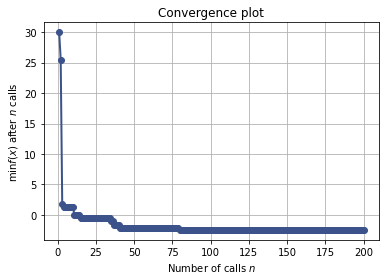

In [25]:
plot_convergence(res2)


In [64]:
def differences_from_measurement(netflow_rate, *args):
    
    sim, edges, nodes, relative_arrival_rates,ising_params = args 
    out = sim.build_network(edges, nodes, relative_arrival_rates, netflow_rate, traffic_cycle = [36,54],
                                ising_params = ising_params, dpi = 10)
    
    #We collect an hour of traffic-flow data
    for __ in range(4500):
        sim.update()
    sim.figure.clf()
    trial_result = []
    for u,v, data in sim.traffic_grid.edges(data = True):
        values_of_interest = ["harmonicAverageSpeed", "averageSpeed", "standardDeviationSpeed", 
                              "travelTimeStandardDeviation", "averageTravelTime"]
        
        simulated_road = data['road']

        road_speeds = pd.DataFrame(simulated_road.data, columns = ["harmonicAverageSpeed", "averageSpeed", "standardDeviationSpeed","Density"]).mean()
        try:
            averageTravelTime = np.mean(simulated_road.travel_times)
        except:
            print("exception")
            averageTravelTime = 0
        try:
            travelTimeStandardDeviation = np.std(simulated_road.travel_times)
        except:
            print("exception")
            travelTimeStandardDeviation = 0
        results = pd.concat((
            pd.Series(simulated_road.ID, index = ["Road_ID"]),
            road_speeds,
            pd.Series(averageTravelTime, index = ["averageTravelTime"]), 
            pd.Series(travelTimeStandardDeviation, index = ["travelTimeStandardDeviation"])), 
            axis = 0
        )
        
        trial_result.append(results)

    output_df = pd.concat(trial_result, axis = 1, ignore_index = True).transpose().sort_values(by = "Road_ID", ignore_index = True)
    
    return(sim, output_df)


In [65]:
import scipy.stats as sts
def ising_config_benchmark(ising_params):
    netflow_values = np.linspace(0.02,2.02,41)
    avgHmeans = []
    errHmeans = []
    avg_inflows = []
    avg_outflows = []
    simulated_density = []
    simualted_density_conf_int = []
    road_wise_data = []
    trials = 5
    progress_bar = tqdm(total=len(netflow_values)*trials)
    for netflow_rate in netflow_values:
        complete_dataframes =[]
        avg_density = []
        avg_inflow = []
        avg_outflow = []
        for __ in range(trials):
            progress_bar.update(1)
            sim,trial_result = differences_from_measurement(netflow_rate,
                                                                    TrafficSystemIsing(),
                                                                    edges, 
                                                                    nodes, 
                                                                    relative_arrival_rates,
                                                                   ising_params)
            
            inflow, outflow = real_flow_rate(sim, 600)
            avg_density.append(np.mean(sim.density))
            avg_inflow.append(inflow)
            avg_outflow.append(outflow)
            complete_dataframes.append(trial_result)
            plt.close()
            
                
        avgHmean,errHmean = compute_weighted_hmean(complete_dataframes)
        
        avg_inflows.append(np.mean(avg_inflow))
        avg_outflows.append(np.mean(avg_outflow))
        avgHmeans.append(avgHmean)
        errHmeans.append(errHmean)
        road_wise_data.append(complete_dataframes)
        simulated_density.append(np.mean(avg_density))
        simualted_density_conf_int.append(sts.sem(avg_density)*1.96)
    return(netflow_values,avgHmeans,errHmeans,simulated_density,simualted_density_conf_int,avg_inflows,avg_outflows, road_wise_data)


In [66]:
netflow_values,avgHmeans,errHmeans,simulated_density,simualted_density_conf_int,avg_inflows,avg_outflows, road_wise_data = ising_config_benchmark(res.x)
results_opt_param1 = [netflow_values,avgHmeans,errHmeans,simulated_density,
                      simualted_density_conf_int,avg_inflows,avg_outflows, road_wise_data]


100%|█████████████████████████████████████████| 205/205 [41:59<00:00, 12.29s/it]


In [67]:
netflow_values,avgHmeans,errHmeans,simulated_density,simualted_density_conf_int,avg_inflows,avg_outflows, road_wise_data = ising_config_benchmark(res2.x)
results_opt_param2 = [netflow_values,avgHmeans,errHmeans,simulated_density,
                      simualted_density_conf_int,avg_inflows,avg_outflows, road_wise_data]


100%|█████████████████████████████████████████| 205/205 [45:28<00:00, 13.31s/it]


In [76]:
with open("optimal_network_flow_ising_baseline", "rb") as fp:   #Unpickling
    netflow_values,simulated_density, simualted_density_conf_int,avg_inflows,avg_outflows, road_wise_data = pickle.load(fp)
avgHmeans = []
errHmeans = []
for dfCollection in road_wise_data:
    avgHmean,errHmean = compute_weighted_hmean(dfCollection)
    avgHmeans.append(avgHmean)
    errHmeans.append(errHmean)
results_opt_baseline = [netflow_values,avgHmeans,errHmeans,simulated_density,
                      simualted_density_conf_int,avg_inflows,avg_outflows, road_wise_data]

In [77]:
len(results_opt_baseline)

8

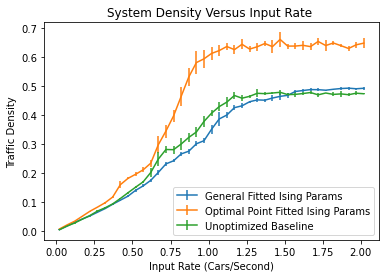

In [78]:
plot_titles = ["General Fitted Ising Params", "Optimal Point Fitted Ising Params", "Unoptimized Baseline"]

for i,dataset in enumerate([results_opt_param1,results_opt_param2,results_opt_baseline]):  
    netflow_values,avgHmeans,errHmeans,simulated_density,simualted_density_conf_int,avg_inflows,avg_outflows, road_wise_data = dataset
    plt.errorbar(netflow_values,simulated_density,simualted_density_conf_int, label = plot_titles[i])
plt.title("System Density Versus Input Rate ")
plt.xlabel("Input Rate (Cars/Second)")
plt.ylabel("Traffic Density")
plt.legend()
plt.show()


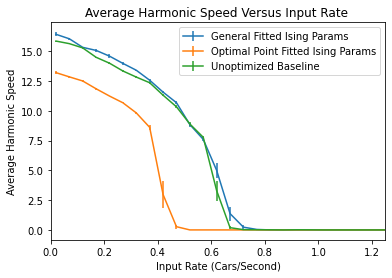

In [80]:
plot_titles = ["General Fitted Ising Params", "Optimal Point Fitted Ising Params", "Unoptimized Baseline"]

for i,dataset in enumerate([results_opt_param1,results_opt_param2,results_opt_baseline]):  
    netflow_values,avgHmeans,errHmeans,simulated_density,simualted_density_conf_int,avg_inflows,avg_outflows, road_wise_data = dataset
    plt.errorbar(netflow_values,avgHmeans,errHmeans, label = plot_titles[i])
plt.title("Average Harmonic Speed Versus Input Rate ")
plt.xlabel("Input Rate (Cars/Second)")
plt.ylabel("Average Harmonic Speed")
plt.legend()
plt.xlim(0,1.25)
plt.show()


In [109]:
from matplotlib import cm, colors
def create_summary_plot(speed_index, var_of_interest,data, colormap = cm.RdYlGn,vmin = "default", vmax = "default", edges = edges ):
    nodes["type"] = nodes["type"].astype("category")
    
    summary_statistics = pd.concat(road_wise_data[speed_index]).astype({"Road_ID":np.int64}).groupby("Road_ID").mean()
    edges_empirical = summary_statistics.merge(edges.loc[:,["Edge_ID","start_x", "start_y", "end_x", "end_y"]],
                             left_on = "Road_ID", right_on = "Edge_ID" )
    #Preview Graph system, and Label Edges and Nodes for referencing

    import matplotlib.pyplot as plt
    from matplotlib import cm, colors
    fig, ax = plt.subplots(figsize=(8, 5))
    my_cmap = colormap
    if vmax =="default":
        vmax = edges_empirical[var_of_interest].max()
    if vmin == "default":
        vmin == edges_empirical[var_of_interest].min()
    my_norm = colors.Normalize(vmin=vmin, vmax= vmax)


    for i,row in enumerate(edges_empirical.iterrows()):
        row = row[1]
        ax.plot([row["start_x"],row["end_x"]],[row["start_y"],row["end_y"]], 
                 color = my_cmap(my_norm(edges_empirical[var_of_interest][i])), linewidth = 5)
        ax.text((row["start_x"]+row["end_x"])/2 + 5,(row["start_y"]+row["end_y"])/2 + 8 , f"E-{i}", fontstyle = "italic")
    node_col = {'inflow':'Blue', 'outflow':'Red', 'intersection': 'Green'}
    ax.scatter(nodes["x"] ,nodes["y"] , s = 30, c = nodes["type"].map(node_col), zorder = 3)
    fig.colorbar(cm.ScalarMappable(norm=my_norm, cmap=my_cmap), orientation="vertical", label=var_of_interest)
    for row in nodes.iterrows():
        row = row[1]
        plt.text(row[0]+5, row[1]+5, f"N-{row[3]}", fontweight = "bold")
    ax.set_title(f"Traffic Heat Map with Inflow rate {netflow_values[speed_index]:.2f} cars/s ")
    ax.axes.tick_params(axis='both', which='both', reset = True,  bottom='off', top='off', labelbottom='off', right='off',
                              left='off',
                              labelleft='off')
    ax.axes.xaxis.set_visible(False)
    ax.axes.yaxis.set_visible(False)
    return fig


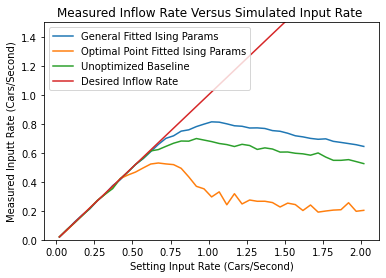

In [147]:
plot_titles = ["General Fitted Ising Params", "Optimal Point Fitted Ising Params", "Unoptimized Baseline"]

for i,dataset in enumerate([results_opt_param1,results_opt_param2,results_opt_baseline]):  
    netflow_values,avgHmeans,errHmeans,simulated_density,simualted_density_conf_int,avg_inflows,avg_outflows, road_wise_data = dataset
    plt.plot(netflow_values,avg_inflows, label = plot_titles[i])
plt.plot(netflow_values,netflow_values, label = "Desired Inflow Rate")
plt.title("Measured Inflow Rate Versus Simulated Input Rate ")
plt.xlabel("Setting Input Rate (Cars/Second)")
plt.ylabel("Measured Input Rate (Cars/Second)")
plt.ylim(0,1.5)
plt.legend()
plt.show()


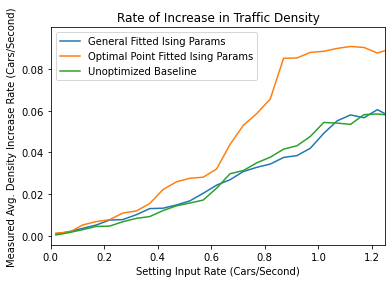

In [94]:
plot_titles = ["General Fitted Ising Params", "Optimal Point Fitted Ising Params", "Unoptimized Baseline"]

for i,dataset in enumerate([results_opt_param1,results_opt_param2,results_opt_baseline]):  
    netflow_values,avgHmeans,errHmeans,simulated_density,simualted_density_conf_int,avg_inflows,avg_outflows, road_wise_data = dataset
    plt.plot(netflow_values,np.array(avg_inflows)-np.array(avg_outflows), label = plot_titles[i])
plt.title("Rate of Increase in Traffic Density")
plt.xlabel("Setting Input Rate (Cars/Second)")
plt.ylabel("Measured Avg. Density Increase Rate (Cars/Second)")
plt.legend()
plt.xlim(0,1.25)
plt.show()

Loading Data of the Markov Matrix

In [126]:
with open("markov_matrix_1.5", "rb") as fp:  #Unpickling
    markov_matrix_15 = pickle.load(fp)

In [128]:
netflow_values = np.linspace(0.02,2.02,41)
theoretical_system_density = []
out_cars = []
for input_rate in netflow_values:
    inflow_array = np.append([input_rate/30], np.zeros(14))
    current_array = inflow_array
    for __ in range(3000):
        current_array = np.dot(markov_matrix,current_array) + inflow_array
    out_cars.append(np.sum(current_array[-4:] * 30))
    theoretical_system_density.append(np.sum(current_array[1:-4]) / len(current_array[1:-4]))


In [129]:
netflow_values = np.linspace(0.02,2.02,41)
system_density = []
out_cars = []
for input_rate in netflow_values:
    inflow_array = np.append([input_rate/30], np.zeros(14))
    current_array = inflow_array
    for __ in range(3000):
        current_array = np.dot(markov_matrix,current_array) + inflow_array
    out_cars.append(np.sum(current_array[-4:] * 30))
    system_density.append(np.sum(current_array[1:-4]) / len(current_array[1:-4]))

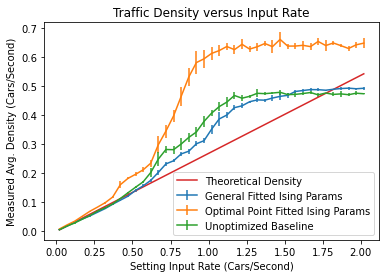

In [166]:
plot_titles = ["General Fitted Ising Params", "Optimal Point Fitted Ising Params", "Unoptimized Baseline"]

for i,dataset in enumerate([results_opt_param1,results_opt_param2,results_opt_baseline]):  
    netflow_values,avgHmeans,errHmeans,simulated_density,simualted_density_conf_int,avg_inflows,avg_outflows, road_wise_data = dataset
    plt.errorbar(netflow_values,simulated_density, simualted_density_conf_int,label = plot_titles[i])
plt.plot(netflow_values,theoretical_system_density, label = "Theoretical Density")
plt.title("Traffic Density versus Input Rate")
plt.xlabel("Setting Input Rate (Cars/Second)")
plt.ylabel("Measured Avg. Density (Cars/Second)")
plt.legend()
plt.show()